# **Quality control inspection on casting defects using CNN and YOLO-NAS**

---


## Team Members


---
Name  | Roll No  |
-------------------|------------------
K.Madhu Kumar       |304
Melvin T       | 311
 Shaibaz       | 309
|Nitish Suryavanshi | 137


---



## Objective

---

The objective of quality inspection for casting defects using machine learning is to automate the process of identifying and characterizing imperfections in cast parts. This approach aims to overcome the limitations of manual inspection, such as subjectivity and time-intensiveness. By leveraging classification algorithms, the system can differentiate between defect-free castings and those with anomalies. Additionally, we can employ regression techniques to quantify the severity of the defects, enabling more precise quality control decisions. Overall, this machine learning-based approach seeks to achieve a more efficient, consistent, and objective quality inspection process in casting production.

---



## Dataset Description

---

These Dataset conatains an Images of  top view  submersible pump impeller.
The dataset contains total 7348 image data. These all are the size of (300*300) pixels grey-scaled images. In all images, augmentation already applied.

The  images size are of  512x512 grayscale. This data set is without Augmentation. This contains 519 ok_front and 781 def_front impeller images.

For capturing these images requires stable lighting, for this we made a special arrangement.

there are mainly two categories:-                                                
1) Defective                                                                     
2)Ok

making classification model we already split data for training and testing into two folders.
Both train and test folder contains def_front and ok_front subfolders.

**Train**:- def_front have 3758 and ok_front have 2875 images                        
**Test**:- def_front have:- def_front have 453 and ok_front have 262 images

---
## References and sources

---


1.   [casting product image data for quality inspection
industrial data,casting manufacturing product, quality inspection, automation](https://www.kaggle.com/datasets/ravirajsinh45/real-life-industrial-dataset-of-casting-product/data)
2.   Pilot Technocast, Shapar, Rajkot https://pilottechnocast.com/


In [ ]:
import tensorflow as tf
from tensorflow.keras import models,layers
import matplotlib.pyplot as plt
import numpy as np
import cv2
from sklearn.metrics import classification_report
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.callbacks import ModelCheckpoint
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import cv2


IMAGE_SIZE: This sets the size of the images used for training, here 256x256 pixels.                   
EPOCHS: This specifies the number of times the entire dataset will be passed through the model for training, set to 50 in this case.                                     
BATCH_SIZE: This defines the number of images processed by the model at once, with a value of 32 here.

In [ ]:
IMAGE_SIZE = 256
EPOCHS=50
BATCH_SIZE = 32
EPOCHS=50

In [ ]:
df=tf.keras.preprocessing.image_dataset_from_directory(
"/content/drive/MyDrive/dataset/casting_512x512/casting_512x512",
shuffle=True,
image_size=(IMAGE_SIZE,IMAGE_SIZE),
batch_size=BATCH_SIZE
)

Found 1300 files belonging to 2 classes.


In [ ]:
cn=df.class_names
cn

['def_front', 'ok_front']

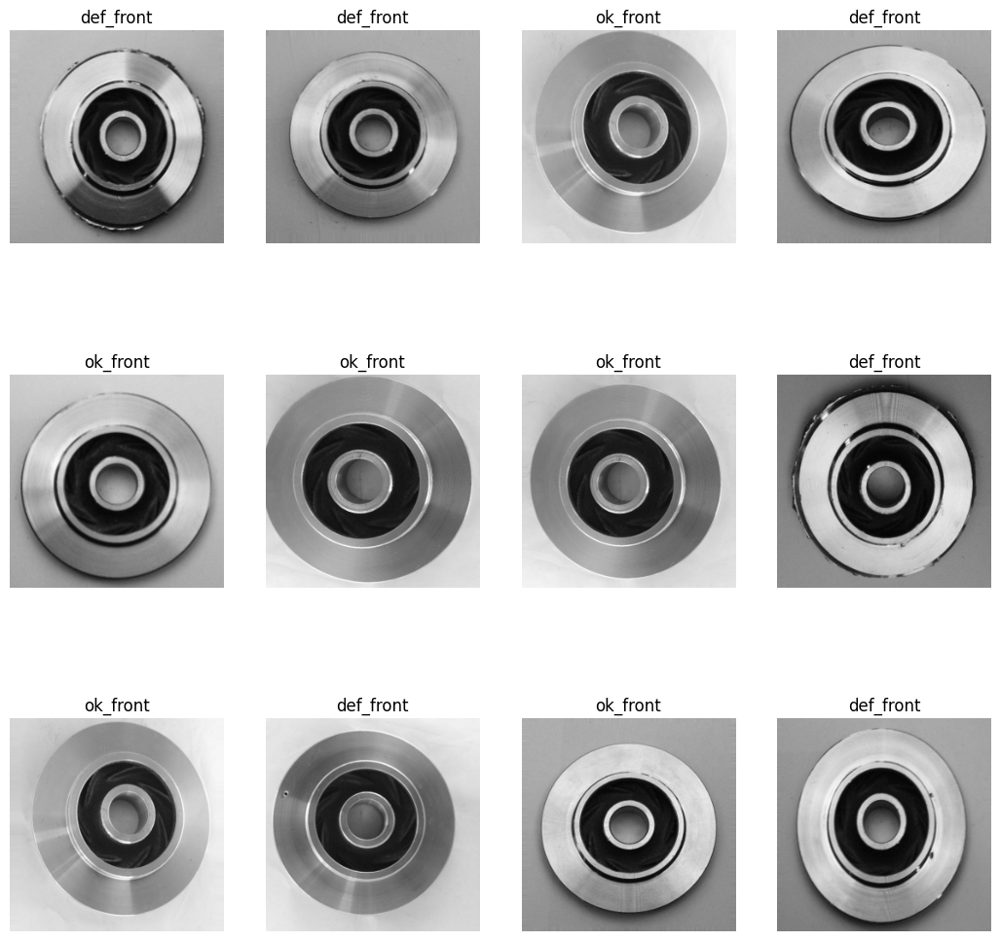

In [ ]:
plt.figure(figsize=(13,13))
for im ,lb in df.take(1):
    for i in range(12):
        ax=plt.subplot(3,4,i+1)
        plt.imshow(im[i].numpy().astype("uint8"))
        plt.title(cn[lb[i]])
        plt.axis("off")

## To Train the images we  Train, validate and test the dataset to build and evaluate the Model


*   **Training Dataset:** This is the primary data used to "train" the model. The model learns patterns and relationships from this data.


*  **Validation Dataset:**This is a separate dataset used to fine-tune the model during training. The model's performance on the validation data helps adjust hyperparameters (settings that control the model's behavior) to prevent overfitting (performing well on training data but poorly on unseen data).

*  **Test Dataset:** This is a completely unseen dataset used for final evaluation of the model's generalizability









In [ ]:
def get_test_train(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=500):
    assert (train_split + test_split + val_split) == 1

    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)

    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds

In [ ]:
train_ds, val_ds, test_ds = get_test_train(df)

###This code snippet then creates a visualization of 12 images from a dataframe (df). It iterates through the image data (im) and corresponding labels (lb) in the dataframe, displaying them in a 3x4 grid layout.
###Finally, the code prepares separate training (train_ds), validation (val_ds), and test (test_ds) datasets for use in TensorFlow. It caches the datasets in memory, shuffles the data order, and prefetches data to optimize training performance.

In [ ]:
train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

###The first model, named resize_and_rescale, performs two essential tasks on the input data:

---



###**Resizing**: It ensures all images have a uniform size (IMAGE_SIZE x IMAGE_SIZE) using the Resizing layer. This standardizes the input for the model.       
###**Rescaling**: The Rescaling layer adjusts the pixel values of the images to a range of 0 to 1. Many deep learning models work more efficiently with data normalized within this range.
###The second model, named data_augmentation, focuses on a technique called data augmentation. This approach artificially expands the training dataset by creating variations of the existing data. Here, it applies two random transformations:

---



###**Random Flipping**: Images can be flipped horizontally or vertically, creating variations that help the model learn features independent of the object's orientation.      
###**Random Rotation**: Images can be rotated up to 20 degrees in either direction. This helps the model learn features that are relevant regardless of the image's rotation.      

---


###By applying these random transformations, data augmentation helps the model become more robust and generalize better to unseen data during evaluation. It can also potentially reduce overfitting, a situation where the model performs well on the training data but poorly on unseen data.

In [ ]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255),
])
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

###The provided code defines a convolutional neural network (CNN) model named model1 specifically designed for image classification. It leverages TensorFlow's Sequential API to build the model layer by layer.

####**Input Shape:** The model expects input data in a specific format defined by in_shape. This shape includes the BATCH_SIZE (likely set elsewhere in your code), the image size (IMAGE_SIZE, assuming it's pre-processed earlier), and the number of color channels (3 for RGB images)

####**Preprocessing Layers:**These layers handle essential preprocessing steps like resizing images to a uniform size and applying random flips or rotations to artificially increase the training data's diversity

####**Feature Extraction Layers:** The core of the model consists of several convolutional layers followed by max pooling layers. These layers work together to extract features from the images. Convolutional layers with activation functions (like ReLU here) identify patterns within the images, while max pooling layers reduce the image's dimensionality while preserving key information

####**Classification Layer:** After feature extraction, a Flatten layer transforms the data into a format suitable for fully-connected layers. Finally, a dense layer with a single neuron and softmax activation is used for classification.

####**Model Building and Summary:** The code explicitly builds the model based on the provided input shape using model1.build().  Finally, model1.summary() provides a detailed report on the model architecture, including the number of parameters and output shape of each layer

In [ ]:
in_shape=(BATCH_SIZE,IMAGE_SIZE,IMAGE_SIZE,3)
model1=models.Sequential(
[
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(32,(3,3),activation="relu",input_shape=in_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(512, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(2, activation='softmax'),



]
)
model1.build(input_shape=in_shape)
model1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (32, 127, 127, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (32, 62, 62, 64)          0         
 g2D)                                                 

#### This line of code sets the stage for training the image classification model model1. It defines the optimizer **(Adam)** that will steer the model towards better performance, the loss function **(Sparse Categorical Crossentropy)** that guides the learning process by measuring errors, and the metric **(accuracy)** that tracks the model's effectiveness in making correct predictions. By carefully choosing these elements, we equip the model with the necessary tools to learn from data and improve its classification abilities

In [ ]:
model1.compile(optimizer='adam',loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),metrics=['accuracy'])

In [ ]:
history = model1.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=15,
)

Epoch 1/15
32/32 [==============================] - 233s 7s/step - loss: 0.7522 - accuracy: 0.5919 - val_loss: 0.6858 - val_accuracy: 0.6016
Epoch 2/15
32/32 [==============================] - 231s 7s/step - loss: 0.6697 - accuracy: 0.6087 - val_loss: 0.6506 - val_accuracy: 0.6016
Epoch 3/15
32/32 [==============================] - 227s 7s/step - loss: 0.6132 - accuracy: 0.6338 - val_loss: 0.5734 - val_accuracy: 0.7578
Epoch 4/15
32/32 [==============================] - 235s 7s/step - loss: 0.5864 - accuracy: 0.7184 - val_loss: 0.5761 - val_accuracy: 0.7188
Epoch 5/15
32/32 [==============================] - 225s 7s/step - loss: 0.5685 - accuracy: 0.7312 - val_loss: 0.5644 - val_accuracy: 0.7031
Epoch 6/15
32/32 [==============================] - 225s 7s/step - loss: 0.5537 - accuracy: 0.7302 - val_loss: 0.5451 - val_accuracy: 0.7578
Epoch 7/15
32/32 [==============================] - 224s 7s/step - loss: 0.5455 - accuracy: 0.7273 - val_loss: 0.5300 - val_accuracy: 0.7422
Epoch 8/15
32

In [ ]:
scores=model1.evaluate(test_ds)
model1.save('Casting_Model')
model1.save('Casting_Model_Lighter.h5')

5/5 [==============================] - 14s 2s/step - loss: 0.3392 - accuracy: 0.8313


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

In [ ]:
import tensorflow as tf

test_loss, test_accuracy = model1.evaluate(test_ds)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

5/5 [==============================] - 12s 2s/step - loss: 0.3392 - accuracy: 0.8313
Test Accuracy: 83.13%


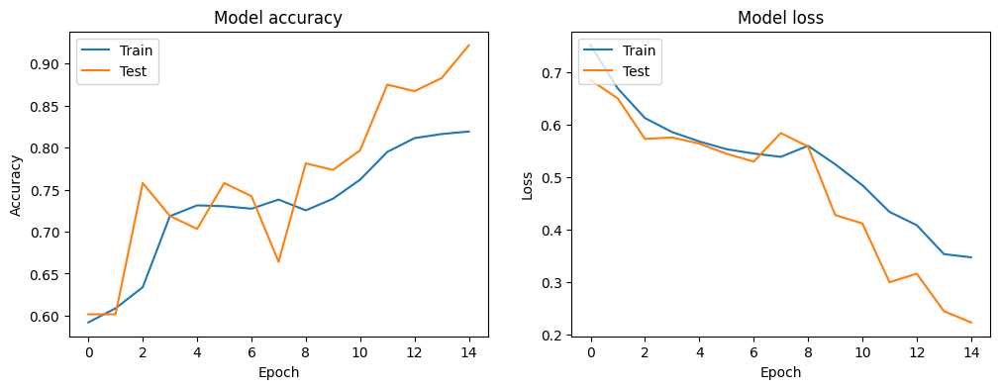

In [ ]:
import matplotlib.pyplot as plt


plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')


plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.show()

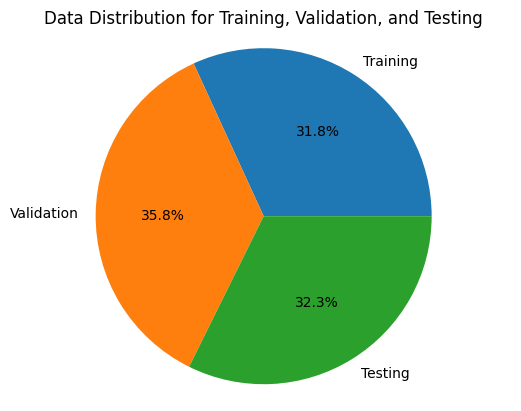

In [ ]:
import matplotlib.pyplot as plt
final_train_acc = acc[-1]
final_val_acc = val_acc[-1]

data = [final_train_acc, final_val_acc, test_accuracy]
labels = ["Training", "Validation", "Testing"]

plt.pie(data, labels=labels, autopct="%1.1f%%")
plt.title("Data Distribution for Training, Validation, and Testing")
plt.axis("equal")
plt.show()



#### This code snippet automates the evaluation process for an image classification model. It iterates through a test dataset, feeds images to the model for prediction, compares the predicted labels with the actual labels, and then generates a comprehensive classification report that summarizes the model's performance for each class. This report allows us to assess the model's strengths and weaknesses, enabling us to make informed decisions about its suitability for the task and potential areas for improvement.

In [ ]:
y_pred = []
y_true = []
for image_batch, label_batch in test_ds:
   y_true.append(label_batch)
   preds = model1.predict(image_batch)
   y_pred.append(np.argmax(preds, axis = - 1))
correct_labels = tf.concat([item for item in y_true], axis = 0)
predicted_labels = tf.concat([item for item in y_pred], axis = 0)
print(classification_report(correct_labels, predicted_labels,target_names=cn))

1/1 [==============================] - 2s 2s/step
              precision    recall  f1-score   support

   def_front       0.96      0.73      0.83        90
    ok_front       0.74      0.96      0.83        70

    accuracy                           0.83       160
   macro avg       0.85      0.85      0.83       160
weighted avg       0.86      0.83      0.83       160



1/1 [==============================] - 2s 2s/step
              precision    recall  f1-score   support

   def_front       0.96      0.73      0.83        90
    ok_front       0.74      0.96      0.83        70

    accuracy                           0.83       160
   macro avg       0.85      0.85      0.83       160
weighted avg       0.86      0.83      0.83       160



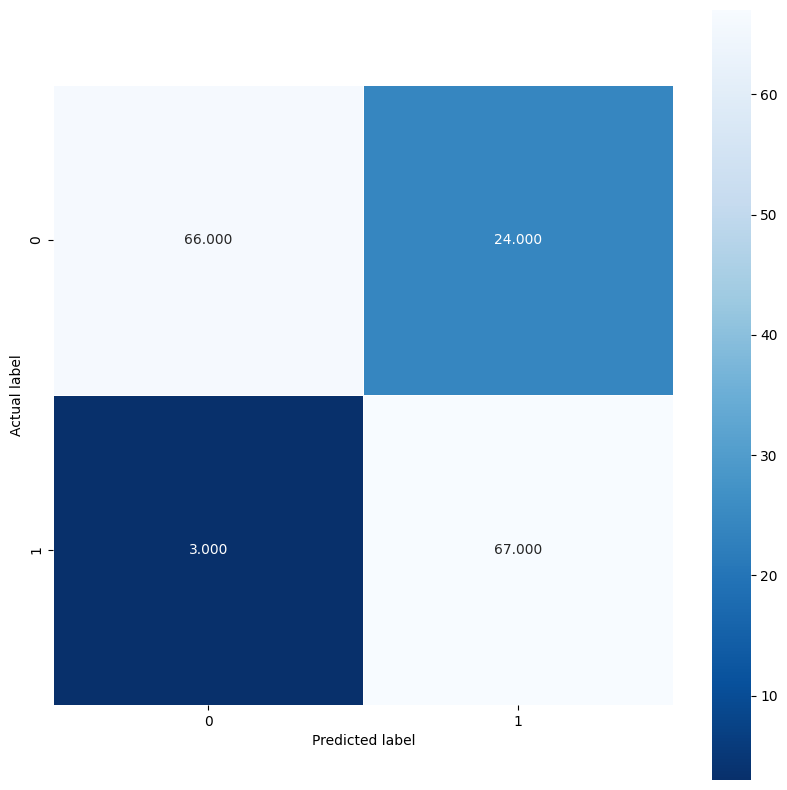

In [ ]:
import seaborn as sns
from sklearn import metrics
y_pred = []
y_true = []
for image_batch, label_batch in test_ds:

   y_true.append(label_batch.numpy())

   preds = model1.predict(image_batch)

   y_pred.append(np.argmax(preds, axis = - 1))
correct_labels = tf.concat([item for item in y_true], axis = 0)
predicted_labels = tf.concat([item for item in y_pred], axis = 0)
print(classification_report(correct_labels, predicted_labels,target_names=cn))

y_true = np.concatenate(y_true).ravel()
y_pred = np.concatenate(y_pred).ravel()

cm = metrics.confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');

In [ ]:
best_model = tf.keras.models.load_model('Casting_Model_Lighter.h5')
y_pred = best_model.predict(test_ds)

5/5 [==============================] - 10s 2s/step


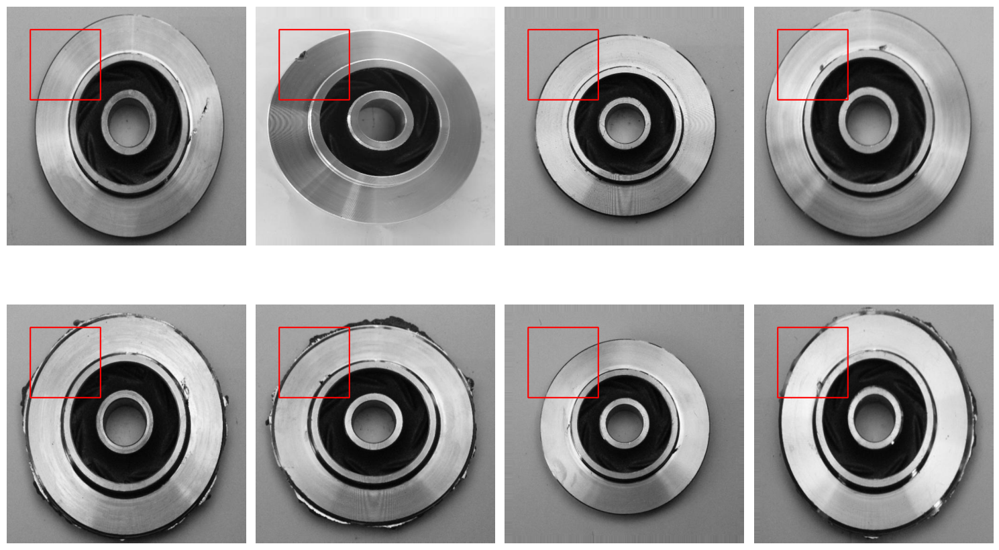

In [ ]:


import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

def detect_and_visualize_defects(image_path):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    detected_defects = [(50, 50, 200, 200)]


    for (x1, y1, x2, y2) in detected_defects:
        cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)

    return image_rgb

image_dir = '/content/drive/MyDrive/dataset/casting_512x512/casting_512x512/def_front'
image_files = os.listdir(image_dir)
image_files = [os.path.join(image_dir, f) for f in image_files]

import random
random_images = random.sample(image_files, 8)


plt.figure(figsize=(15, 10))
for i, image_path in enumerate(random_images):
    plt.subplot(2, 4, i + 1)
    plt.imshow(detect_and_visualize_defects(image_path))
    plt.axis('off')

plt.tight_layout()
plt.show()

## Defect Detection using YOLO-NAS(You Only Look Once Neural-Architecture Search)

---


YOLO-NAS is a strong contender for defect detection tasks due to its ability to balance speed and accuracy. It inherits the fast processing nature of the YOLO family of object detectors, making it suitable for real-time applications. Additionally, YOLO-NAS utilizes Neural Architecture Search (NAS) to automatically design an optimal network architecture for the specific defect detection problem. This can lead to improved accuracy compared to traditional YOLO models while maintaining efficiency. Overall, YOLO-NAS offers an attractive option for deploying defect detection systems where speed and precision are crucial.

---



###Below shows graphical represntation showing how flexible YOLO-NAS is in terms of accuracy in detecting defect with less parameters

---
![YOLO-NAS](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_frontier.png)


###Installing libraries required for Training and testing the images

In [ ]:
!pip install -q git+https://github.com/Deci-AI/super-gradients.git@stable
!pip install -q roboflow
!pip install -q supervision

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 13.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 46.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 37.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 64.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 82.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 78.1 MB/s eta 0:00:00
  Preparing met

###This code snippet retrieves the current directory's path and prints it. This is helpful when you're working with files and directories within your Python script, and you need to know the exact location the script is running from.

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


### This code snippet configures the environment for running a YOLO-NAS object detection model. It checks for GPU availability and sets the appropriate device for computations (DEVICE). It also defines the model architecture (MODEL_ARCH) to be used during the inference process (likely for object detection).

In [ ]:
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
MODEL_ARCH = 'yolo_nas_l'

In [ ]:
f"{HOME}/data"

'/content/data'

In [ ]:
%cd {HOME}
!mkdir {HOME}/data
%cd {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-5.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-6.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-7.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-8.jpeg

/content
/content/data


### This code snippet establishes a connection to a specific Roboflow project and downloads a particular version (YOLO-V5 pytorch) of the project's dataset in the YOLOv5 format. This downloaded dataset is likely intended for computer vision tasks, potentially involving object detection or image classification using the YOLOv5 framework.

#### note: This dataset is a pre-trained dataset model with labels to classify the defects in the casting model with YOLO-V5. but the model architecture used to classify these defects in casting is done with the help of YOLO-NAS

In [ ]:
%cd {HOME}

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="uKafN8fUElGWeZB5P0dd")
project = rf.workspace("new-workspace-kmz9b").project("casting-detection-leboi")
version = project.version(10)
dataset = version.download("yolov5")


/content
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Casting-detection-10 in yolov5pytorch:: 100%|██████████| 8552/8552 [00:02<00:00, 3994.65it/s]


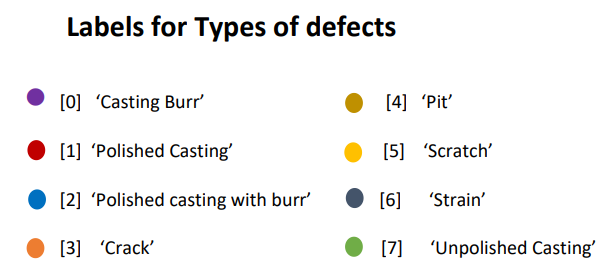

In [ ]:
LOCATION = dataset.location
print("location:", LOCATION)
CLASSES = sorted(project.classes.keys())
print("classes:", CLASSES)

location: /content/Casting-detection-10
classes: ['Casting_burr', 'Polished_casting', 'Polished_casting_with_burr', 'crack', 'pit', 'scratch', 'strain', 'unpolished_casting']


###This code snippet configures essential parameters for training a deep learning model:

---



* It specifies the model architecture (yolo_nas_l).
* It sets the batch size to 15, which determines how many samples are processed together during training.
* It defines the maximum number of training epochs (8), controlling how many times the model goes through the entire dataset.                  
These parameters play a crucial role in the training process, influencing the speed, efficiency, and ultimately, the performance of the trained model.

In [ ]:
MODEL_ARCH = 'yolo_nas_l'
BATCH_SIZE = 15
MAX_EPOCHS = 8
CHECKPOINT_DIR = f'{HOME}/checkpoints'
EXPERIMENT_NAME = project.name.lower().replace(" ", "_")

In [ ]:

from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)


The console stream is logged into /root/sg_logs/console.log


[2024-06-22 18:28:06] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2024-06-22 18:28:17] INFO - utils.py - NumExpr defaulting to 2 threads.
[2024-06-22 18:28:22] INFO - env_sanity_check.py - Library check is not supported when super_gradients installed through "git+https://github.com/..." command




---


###The below code snippet creates a dictionary that acts as a configuration file, specifying the location of various data files used to train a machine learning model. It defines folders containing training, validation, and test images and labels, along with the class labels the model should recognize.

---



In [ ]:
dataset_params = {
    'data_dir': LOCATION,
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': CLASSES
}


### The code snippet loads and prepares datasets for training, validation, and testing a YOLO object detection model. It leverages SuperGradients' functions designed to handle data specifically formatted in the COCO standard. The code defines separate datasets with information about image locations, labels, and hyperparameters for data loading efficiency.

---
### Dataloader Parameters:
### * batch_size: This specifies the number of images to be processed together in a single batch during training/evaluation.
### * num_workers: This specifies the number of worker threads to use for parallel data loading.


In [ ]:
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

[2024-06-22 18:28:23] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 3659/3659 [00:01<00:00, 3175.78it/s]
[2024-06-22 18:28:24] WARNING - detection_dataset.py - Found 28 invalid bbox that were ignored. For more information, please set `show_all_warnings=True`.
[2024-06-22 18:28:25] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 391/391 [00:00<00:00, 4032.86it/s]
[2024-06-22 18:28:25] WARNING - detection_dataset.py - Found 3 invalid bbox that were ignored. For more information, please set `show_all_warnings=True`.
[2024-06-22 18:28:25] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset inde

In [ ]:
train_data.dataset.transforms



---


* model = models.get(...) calls the models.get function to create a new model instance.
* MODEL_ARCH: This argument specifies the desired model architecture as a string. It should correspond to one of the architectures offered by SuperGradients (e.g., "resnet18", "yolov5m").
* num_classes=len(dataset_params['classes']): This sets the number of classes the model should be able to detect. It retrieves the number of classes from the 'classes' key within the dataset_params dictionary.
* pretrained_weights="coco": This argument specifies that the model should be loaded with pre-trained weights obtained on the COCO dataset, a popular benchmark for object detection. This enables faster training by leveraging knowledge learned from a large dataset

---



In [ ]:
from super_gradients.training import models

model = models.get(MODEL_ARCH,num_classes=len(dataset_params['classes']),pretrained_weights="coco")

[2024-06-22 18:28:27] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-06-22 18:28:27] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth
100%|██████████| 256M/256M [00:07<00:00, 38.3MB/s]
[2024-06-22 18:28:35] INFO - checkpoin



---


####The Below code is a code for training parameters extracted from the YOLO-NAS repository. This code snipppet finds best optimization rate for predicting the defects and prevents it from overfitting the model

---


###Validation Metrics:

* It configures a list of metrics for validation using valid_metrics_list.
* Defines the DetectionMetrics_050 metric for evaluating object detection at an Intersection-over-Union (IoU) threshold of 0.5.
* Sets various thresholds and configurations for the metric:
* Minimum classification score threshold (score_thres).
* Maximum number of predictions to consider (top_k_predictions).
* Normalizes targets (normalize_targets).
* Uses PPYoloEPostPredictionCallback for post-processing predictions before evaluation:
* Minimum score threshold for filtering predictions (score_threshold).
* Maximum number of detections before applying Non-Maximum Suppression (NMS) (nms_top_k).
* Maximum number of detections to keep after NMS (max_predictions).
* IoU threshold for NMS (nms_threshold).

---


#### In Summary This code configures a training process for object detection using SuperGradients. It defines various hyperparameters for learning rate scheduling, optimization, and uses a custom loss function (PPYoloELoss) suited for object detection tasks. It also establishes evaluation metrics using DetectionMetrics_050 and a post-processing callback for proper evaluation during validation. Finally, it specifies the mAP@0.5(Mean Average Precision) (mAP) IoU as the key metric to monitor for optimal object detection performance.

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": MAX_EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}



---


 ### This code retrieves the sequence of transformations that are applied to each data point before feeding it into the machine learning model during training. These transformations are crucial for improving the model's performance and generalization capabilities.

### For example, if you're training an image classification model, the transforms might include resizing images, converting them to tensors, and potentially normalizing the pixel values.This is all done automatically to find the best fit for the model

---



In [ ]:
train_data.dataset.transforms

<Figure size 1000x1000 with 0 Axes>

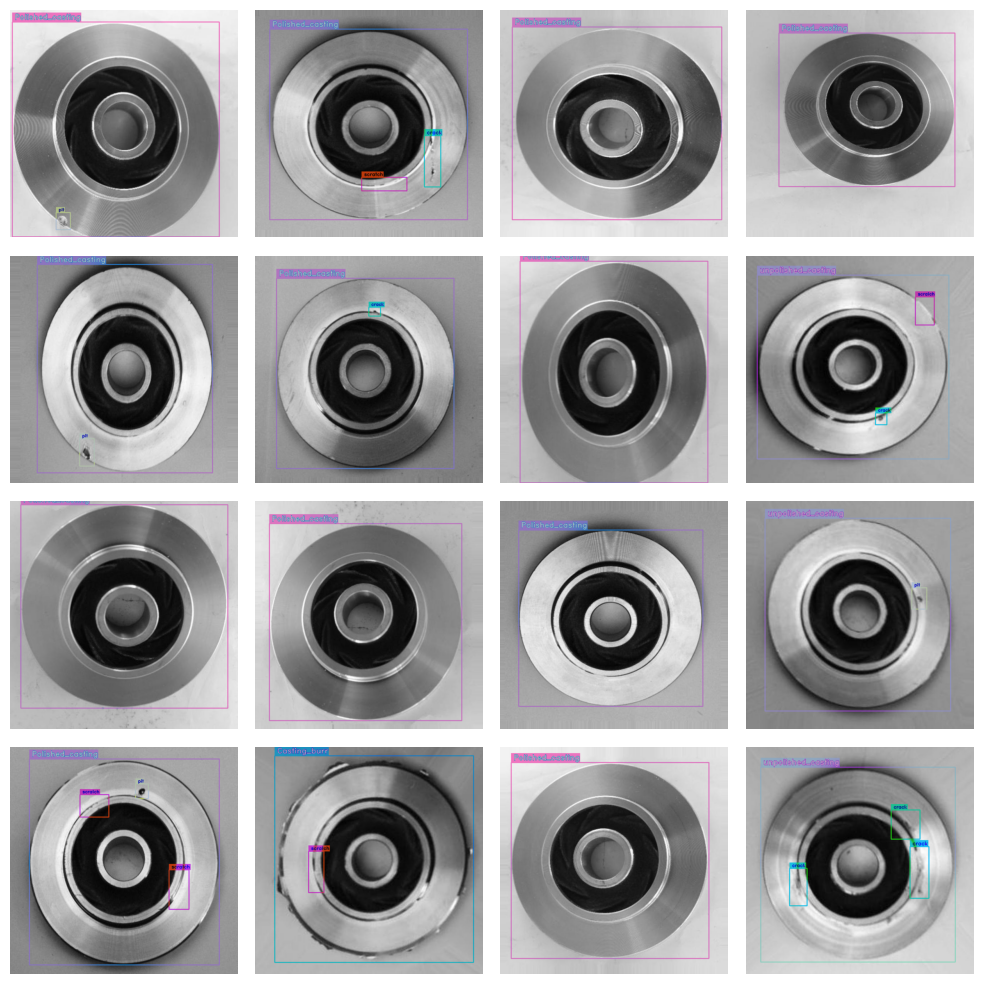

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
test_data.dataset.plot()

In [ ]:
from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)



---


### This line of code initiates the training process for a machine learning model using the SuperGradients library. It provides the model to be trained, the training configuration parameters, and the data loaders for both training and validation data. The trainer object then manages the training loop, feeding data to the model, updating its weights based on the training parameters, and evaluating its performance on the validation data.

---



In [ ]:
trainer.train(model=model,training_params=train_params,train_loader=train_data,valid_loader=val_data)

[2024-06-22 18:28:46] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20240622_182846_166525`
[2024-06-22 18:28:46] INFO - sg_trainer.py - Checkpoints directory: /content/checkpoints/casting_detection/RUN_20240622_182846_166525
[2024-06-22 18:28:46] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}


The console stream is now moved to /content/checkpoints/casting_detection/RUN_20240622_182846_166525/console_Jun22_18_28_46.txt


Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
[2024-06-22 18:28:56] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            3659       (len(train_set))
    - Batch size per GPU:           15         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             15         (num_gpus * batch_s

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.8162
│   ├── Ppyoloeloss/loss_iou = 0.6296
│   ├── Ppyoloeloss/loss_dfl = 0.7744
│   └── Ppyoloeloss/loss = 3.2202
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.511
    ├── Ppyoloeloss/loss_iou = 0.4482
    ├── Ppyoloeloss/loss_dfl = 0.6296
    ├── Ppyoloeloss/loss = 2.5888
    ├── Precision@0.50 = 0.0579
    ├── Recall@0.50 = 0.269
    ├── Map@0.50 = 0.1492
    ├── F1@0.50 = 0.0715
    └── Best_score_threshold = 0.53



Validating epoch 1: 100%|██████████| 27/27 [00:17<00:00,  1.51it/s]
[2024-06-22 18:40:22] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/casting_detection/RUN_20240622_182846_166525/ckpt_best.pth
[2024-06-22 18:40:22] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5277348160743713


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0523
│   │   ├── Epoch N-1      = 1.8162 (↘ -0.7638)
│   │   └── Best until now = 1.8162 (↘ -0.7638)
│   ├── Ppyoloeloss/loss_iou = 0.4123
│   │   ├── Epoch N-1      = 0.6296 (↘ -0.2173)
│   │   └── Best until now = 0.6296 (↘ -0.2173)
│   ├── Ppyoloeloss/loss_dfl = 0.5275
│   │   ├── Epoch N-1      = 0.7744 (↘ -0.2469)
│   │   └── Best until now = 0.7744 (↘ -0.2469)
│   └── Ppyoloeloss/loss = 1.9922
│       ├── Epoch N-1      = 3.2202 (↘ -1.228)
│       └── Best until now = 3.2202 (↘ -1.228)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9793
    │   ├── Epoch N-1      = 1.511  (↘ -0.5316)
    │   └── Best until now = 1.511  (↘ -0.5316)
    ├── Ppyoloeloss/loss_iou = 0.3862
    │   ├── Epoch N-1      = 0.4482 (↘ -0.062)
    │   └── Best until now = 0.4482 (↘ -0.062)
    ├── Ppyoloeloss/loss_dfl = 0.4849
    │   ├── Epoch N-1      = 0.6296 (↘ -0.1447)
    │   └── Best until now = 0.6296 (↘ -0.1447)
    ├── Ppyoloeloss/loss =

Validating epoch 2: 100%|██████████| 27/27 [00:17<00:00,  1.52it/s]
[2024-06-22 18:45:56] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/casting_detection/RUN_20240622_182846_166525/ckpt_best.pth
[2024-06-22 18:45:56] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6109830737113953


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9465
│   │   ├── Epoch N-1      = 1.0523 (↘ -0.1058)
│   │   └── Best until now = 1.0523 (↘ -0.1058)
│   ├── Ppyoloeloss/loss_iou = 0.3872
│   │   ├── Epoch N-1      = 0.4123 (↘ -0.0251)
│   │   └── Best until now = 0.4123 (↘ -0.0251)
│   ├── Ppyoloeloss/loss_dfl = 0.5032
│   │   ├── Epoch N-1      = 0.5275 (↘ -0.0244)
│   │   └── Best until now = 0.5275 (↘ -0.0244)
│   └── Ppyoloeloss/loss = 1.8369
│       ├── Epoch N-1      = 1.9922 (↘ -0.1553)
│       └── Best until now = 1.9922 (↘ -0.1553)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9412
    │   ├── Epoch N-1      = 0.9793 (↘ -0.0381)
    │   └── Best until now = 0.9793 (↘ -0.0381)
    ├── Ppyoloeloss/loss_iou = 0.3672
    │   ├── Epoch N-1      = 0.3862 (↘ -0.019)
    │   └── Best until now = 0.3862 (↘ -0.019)
    ├── Ppyoloeloss/loss_dfl = 0.4716
    │   ├── Epoch N-1      = 0.4849 (↘ -0.0133)
    │   └── Best until now = 0.4849 (↘ -0.0133)
    ├── Ppyoloeloss/loss

Validating epoch 3: 100%|██████████| 27/27 [00:17<00:00,  1.51it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9192
│   │   ├── Epoch N-1      = 0.9465 (↘ -0.0273)
│   │   └── Best until now = 0.9465 (↘ -0.0273)
│   ├── Ppyoloeloss/loss_iou = 0.382
│   │   ├── Epoch N-1      = 0.3872 (↘ -0.0052)
│   │   └── Best until now = 0.3872 (↘ -0.0052)
│   ├── Ppyoloeloss/loss_dfl = 0.4965
│   │   ├── Epoch N-1      = 0.5032 (↘ -0.0066)
│   │   └── Best until now = 0.5032 (↘ -0.0066)
│   └── Ppyoloeloss/loss = 1.7977
│       ├── Epoch N-1      = 1.8369 (↘ -0.0391)
│       └── Best until now = 1.8369 (↘ -0.0391)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8763
    │   ├── Epoch N-1      = 0.9412 (↘ -0.0649)
    │   └── Best until now = 0.9412 (↘ -0.0649)
    ├── Ppyoloeloss/loss_iou = 0.34
    │   ├── Epoch N-1      = 0.3672 (↘ -0.0272)
    │   └── Best until now = 0.3672 (↘ -0.0272)
    ├── Ppyoloeloss/loss_dfl = 0.4573
    │   ├── Epoch N-1      = 0.4716 (↘ -0.0144)
    │   └── Best until now = 0.4716 (↘ -0.0144)
    ├── Ppyoloeloss/loss 

Validating epoch 4: 100%|██████████| 27/27 [00:17<00:00,  1.51it/s]
[2024-06-22 18:57:44] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/casting_detection/RUN_20240622_182846_166525/ckpt_best.pth
[2024-06-22 18:57:44] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6506301164627075


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8702
│   │   ├── Epoch N-1      = 0.9192 (↘ -0.049)
│   │   └── Best until now = 0.9192 (↘ -0.049)
│   ├── Ppyoloeloss/loss_iou = 0.3553
│   │   ├── Epoch N-1      = 0.382  (↘ -0.0266)
│   │   └── Best until now = 0.382  (↘ -0.0266)
│   ├── Ppyoloeloss/loss_dfl = 0.4705
│   │   ├── Epoch N-1      = 0.4965 (↘ -0.026)
│   │   └── Best until now = 0.4965 (↘ -0.026)
│   └── Ppyoloeloss/loss = 1.6961
│       ├── Epoch N-1      = 1.7977 (↘ -0.1017)
│       └── Best until now = 1.7977 (↘ -0.1017)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9195
    │   ├── Epoch N-1      = 0.8763 (↗ 0.0432)
    │   └── Best until now = 0.8763 (↗ 0.0432)
    ├── Ppyoloeloss/loss_iou = 0.3778
    │   ├── Epoch N-1      = 0.34   (↗ 0.0378)
    │   └── Best until now = 0.34   (↗ 0.0378)
    ├── Ppyoloeloss/loss_dfl = 0.489
    │   ├── Epoch N-1      = 0.4573 (↗ 0.0317)
    │   └── Best until now = 0.4573 (↗ 0.0317)
    ├── Ppyoloeloss/loss = 1.7862

Validating epoch 5: 100%|██████████| 27/27 [00:17<00:00,  1.51it/s]
[2024-06-22 19:03:34] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/casting_detection/RUN_20240622_182846_166525/ckpt_best.pth
[2024-06-22 19:03:34] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6746023297309875


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8463
│   │   ├── Epoch N-1      = 0.8702 (↘ -0.024)
│   │   └── Best until now = 0.8702 (↘ -0.024)
│   ├── Ppyoloeloss/loss_iou = 0.3372
│   │   ├── Epoch N-1      = 0.3553 (↘ -0.0181)
│   │   └── Best until now = 0.3553 (↘ -0.0181)
│   ├── Ppyoloeloss/loss_dfl = 0.4535
│   │   ├── Epoch N-1      = 0.4705 (↘ -0.017)
│   │   └── Best until now = 0.4705 (↘ -0.017)
│   └── Ppyoloeloss/loss = 1.6369
│       ├── Epoch N-1      = 1.6961 (↘ -0.0591)
│       └── Best until now = 1.6961 (↘ -0.0591)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8871
    │   ├── Epoch N-1      = 0.9195 (↘ -0.0323)
    │   └── Best until now = 0.8763 (↗ 0.0108)
    ├── Ppyoloeloss/loss_iou = 0.3757
    │   ├── Epoch N-1      = 0.3778 (↘ -0.0021)
    │   └── Best until now = 0.34   (↗ 0.0357)
    ├── Ppyoloeloss/loss_dfl = 0.4768
    │   ├── Epoch N-1      = 0.489  (↘ -0.0121)
    │   └── Best until now = 0.4573 (↗ 0.0196)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 6: 100%|██████████| 27/27 [00:17<00:00,  1.51it/s]
[2024-06-22 19:09:36] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/casting_detection/RUN_20240622_182846_166525/ckpt_best.pth
[2024-06-22 19:09:36] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.688036322593689


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8183
│   │   ├── Epoch N-1      = 0.8463 (↘ -0.028)
│   │   └── Best until now = 0.8463 (↘ -0.028)
│   ├── Ppyoloeloss/loss_iou = 0.3181
│   │   ├── Epoch N-1      = 0.3372 (↘ -0.0191)
│   │   └── Best until now = 0.3372 (↘ -0.0191)
│   ├── Ppyoloeloss/loss_dfl = 0.4395
│   │   ├── Epoch N-1      = 0.4535 (↘ -0.0139)
│   │   └── Best until now = 0.4535 (↘ -0.0139)
│   └── Ppyoloeloss/loss = 1.5759
│       ├── Epoch N-1      = 1.6369 (↘ -0.061)
│       └── Best until now = 1.6369 (↘ -0.061)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8682
    │   ├── Epoch N-1      = 0.8871 (↘ -0.0189)
    │   └── Best until now = 0.8763 (↘ -0.0081)
    ├── Ppyoloeloss/loss_iou = 0.3529
    │   ├── Epoch N-1      = 0.3757 (↘ -0.0228)
    │   └── Best until now = 0.34   (↗ 0.0129)
    ├── Ppyoloeloss/loss_dfl = 0.4555
    │   ├── Epoch N-1      = 0.4768 (↘ -0.0213)
    │   └── Best until now = 0.4573 (↘ -0.0018)
    ├── Ppyoloeloss/loss = 

Validating epoch 7: 100%|██████████| 27/27 [00:18<00:00,  1.46it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.794
│   │   ├── Epoch N-1      = 0.8183 (↘ -0.0243)
│   │   └── Best until now = 0.8183 (↘ -0.0243)
│   ├── Ppyoloeloss/loss_iou = 0.3089
│   │   ├── Epoch N-1      = 0.3181 (↘ -0.0091)
│   │   └── Best until now = 0.3181 (↘ -0.0091)
│   ├── Ppyoloeloss/loss_dfl = 0.4326
│   │   ├── Epoch N-1      = 0.4395 (↘ -0.007)
│   │   └── Best until now = 0.4395 (↘ -0.007)
│   └── Ppyoloeloss/loss = 1.5355
│       ├── Epoch N-1      = 1.5759 (↘ -0.0404)
│       └── Best until now = 1.5759 (↘ -0.0404)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8735
    │   ├── Epoch N-1      = 0.8682 (↗ 0.0053)
    │   └── Best until now = 0.8682 (↗ 0.0053)
    ├── Ppyoloeloss/loss_iou = 0.3641
    │   ├── Epoch N-1      = 0.3529 (↗ 0.0113)
    │   └── Best until now = 0.34   (↗ 0.0242)
    ├── Ppyoloeloss/loss_dfl = 0.4675
    │   ├── Epoch N-1      = 0.4555 (↗ 0.012)
    │   └── Best until now = 0.4555 (↗ 0.012)
    ├── Ppyoloeloss/loss = 1.7051

[2024-06-22 19:16:35] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 8: 100%|██████████| 27/27 [00:18<00:00,  1.49it/s]


In [ ]:
%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

Reusing TensorBoard on port 6006 (pid 14054), started 0:44:29 ago. (Use '!kill 14054' to kill it.)

<IPython.core.display.Javascript object>

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!zip -r yolo_nas.zip {CHECKPOINT_DIR}/{EXPERIMENT_NAME}



`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


  adding: content/checkpoints/casting_detection/ (stored 0%)
  adding: content/checkpoints/casting_detection/RUN_20240622_182846_166525/ (stored 0%)
  adding: content/checkpoints/casting_detection/RUN_20240622_182846_166525/ckpt_latest.pth (deflated 8%)
  adding: content/checkpoints/casting_detection/RUN_20240622_182846_166525/experiment_logs_Jun22_18_28_46.txt (deflated 73%)
  adding: content/checkpoints/casting_detection/RUN_20240622_182846_166525/ckpt_best.pth (deflated 8%)
  adding: content/checkpoints/casting_detection/RUN_20240622_182846_166525/console_Jun22_18_28_46.txt (deflated 94%)
  adding: content/checkpoints/casting_detection/RUN_20240622_182846_166525/events.out.tfevents.1719080926.06fc8aadb82b.313.0 (deflated 82%)
  adding: content/checkpoints/casting_detection/RUN_20240622_182846_166525/average_model.pth

In [ ]:
from google.colab import drive
drive.mount('/content/drive')



---


### The Below code snippet loads a pre-trained model architecture based on the MODEL_ARCH configuration. It then configures the model's output layer to match the number of classes in your dataset and loads the pre-trained weights from the specified checkpoint file. Finally, it places the model on the designated device (CPU or GPU) for further use.

###This code is likely part of a larger machine learning pipeline, possibly for object detection or image classification. By loading a pre-trained model and fine-tuning it with your specific data (through the dataset_params), you can potentially achieve better results compared to training a model from scratch.

---



In [ ]:
best_model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    checkpoint_path="/content/checkpoints/casting_detection/RUN_20240622_182846_166525/average_model.pth"
).to(DEVICE)

[2024-06-22 19:23:24] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/casting_detection/RUN_20240622_182846_166525/average_model.pth checkpoint.


In [ ]:
import os

# Check if the file exists
file_path = "/content/checkpoints/casting_detection/RUN_20240622_182846_166525/average_model.pth"
if os.path.exists(file_path):
    print("File exists at the specified path.")
else:
    print("File not found at the specified path.")

# List files in the directory to verify
directory_path = "/content/checkpoints/casting_detection/"
print("Files in the directory:", os.listdir(directory_path))

File exists at the specified path.
Files in the directory: ['RUN_20240622_182846_166525']


In [ ]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Testing:  93%|█████████▎| 14/15 [00:12<00:00,  1.35it/s]

{'PPYoloELoss/loss_cls': 0.93249583,
 'PPYoloELoss/loss_iou': 0.35641888,
 'PPYoloELoss/loss_dfl': 0.46626046,
 'PPYoloELoss/loss': 1.7551758,
 'Precision@0.50': 0.2879708409309387,
 'Recall@0.50': 0.888761579990387,
 'mAP@0.50': 0.7175325751304626,
 'F1@0.50': 0.3892328143119812,
 'Best_score_threshold': 0.22999998927116394}

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml",
    force_masks=False
)

Testing: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]




---


###  This code performs object detection on the  Dataset  of images using a pre-trained model. It applies a confidence threshold to filter out low-confidence detections and stores the final results (bounding boxes, confidence scores, class labels) for each image in a dictionary.

---



In [ ]:
import supervision as sv

CONFIDENCE_TRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    result = best_model.predict(image, conf=CONFIDENCE_TRESHOLD) # Remove list() and indexing
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections

[2024-06-22 19:23:58] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-06-22 19:23:59] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-06-22 19:23:59] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-06-22 19:23:59] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-06-22 19:23:59] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-06-22 19:23:59] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-06-22 19:24:00] INFO -



---


### Random is library which extracts 20  Best Random imgaes from the trained dataset and displays them with labels and defects predicted by model

---



In [ ]:
import random
random.seed(20)



---


### This code visualizes and compares ground truth annotations with a model's predictions for a limited set of images. It first randomly selects a subset of images and copies them to avoid modifying the originals. Then, it utilizes a BoxAnnotator to draw bounding boxes around objects in the images. The code iterates twice per image: once using the known object locations (ground truth) and again using the model's predictions. This results in two versions of each image, one highlighting actual objects and another showcasing the model's guesses. Finally, a custom function displays these processed images in a grid format, allowing for side-by-side comparison of detections and predictions. This visualization helps assess the model's performance and identify potential areas for improvement

---



SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `B

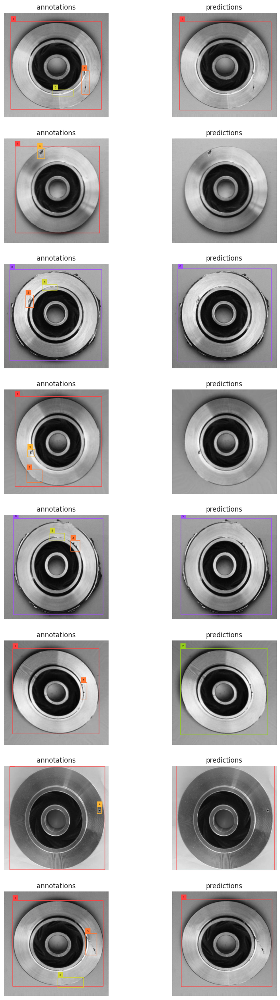

In [ ]:
import supervision as sv

MAX_IMAGE_COUNT = 8

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=False
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=False
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 5, n * 4))

## Reference  to the above image  identify the type of defect in casting
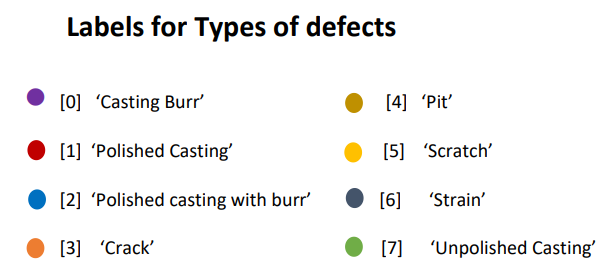

In [ ]:
!pip install onemetric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 kB 3.6 MB/s eta 0:00:00


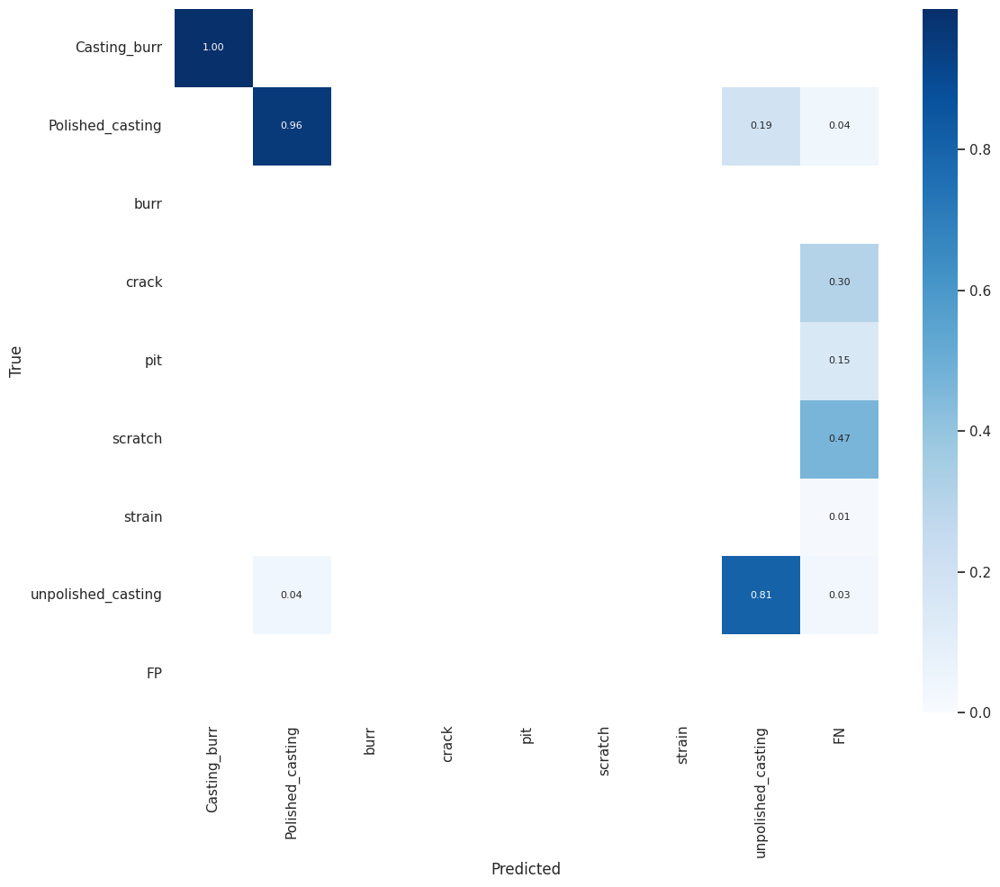

In [ ]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)



---


# Conclusion

---


###quality control inspection of casting defects serves as the cornerstone for ensuring the structural integrity and functionality of the final product. By meticulously identifying defects like gas porosity, shrinkage cavities, or cracks, inspectors act as the final line of defense against compromised parts.  This inspection process not only allows for the segregation of defective castings, but also provides crucial data for continuous improvement. Analyzing the type, location, and severity of defects empowers engineers to pinpoint the root cause within the casting process.